<img align="left" src = https://project.lsst.org/sites/default/files/Rubin-O-Logo_0.png width=250 style="padding: 10px"> 
<br>
<b> DM-46678-Update subtractImages sourceSelector configs </b><br>
Notebook comparing main with the updated sourceSelector configs in subtractImages (<code>diffIm</code>). <br> <br>

Contact author: Audrey Budlong <br>
Last verified to run: 16 October 2024 <br>
LSST Science Pipelines version: <code>d_2024_10_07</code> <br>
Additional notes: run with a local ap_verfify run of <code>ap_verify_ci_hits2015</code> <br>

## Run details

Baseline run using <code>d_2024_10_07</code>. 

### Table of Contents

1. Main package imports
2. Configuring data access
3. APBD Source Comparison
4. Visualizing APDB Source Comparison
5. Extendedness Flag Comparison to Main
6. Visualzing Flags

### 1. Main package imports

In [1]:
import lsst.afw.display as afwDisplay
import lsst.geom as geom
import gc
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import pandas as pd
import seaborn as sns
import warnings

from astropy.table import Table
from astropy.visualization import make_lupton_rgb
from astropy.wcs import WCS
from lsst.afw.image import MultibandExposure
from lsst.analysis.ap import apdb, nb_utils
from lsst.analysis.ap import plotImageSubtractionCutouts as plotISC
from lsst.daf.butler import Butler
from sqlalchemy import select, func

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
plt.style.use('ggplot')

warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

### 2. Configuring data access

In [2]:
repo_main = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_10_07/repo/butler.yaml'
repo_updated = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_10_07-DM46678/repo/butler.yaml'
collections = 'ap_verify-output'
instrument = 'DECam'
skymap = 'decam_rings_v1'

butler_main = Butler(repo_main, collections=collections)
butler_updated = Butler(repo_updated, collections=collections)

dbType = 'sqlite'
dbName_main = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_10_07/association.db'
dbName_updated = '/Users/audrey/Documents/LSST/code/ap_verify-runs/DECam/d_2024_10_07-DM46678/association.db'

reader_main = apdb.ApdbSqliteQuery(dbName_main, instrument=instrument)
reader_updated = apdb.ApdbSqliteQuery(dbName_updated, instrument=instrument)

In [3]:
len(reader_main._tables), len(reader_updated._tables)

(6, 6)

In [4]:
main_run = {
    'repo': repo_main,
    'collections': collections,
    'instrument': instrument,
    'skymap': skymap,
    'butler': butler_main,
    'dbType': dbType,
    'dbName': dbName_main,
    'reader': reader_main
}

updated_run = {
    'repo': repo_updated,
    'collections': collections,
    'instrument': instrument,
    'skymap': skymap,
    'butler': butler_updated,
    'dbType': dbType,
    'dbName': dbName_updated,
    'reader': reader_updated
}

In [5]:
main_run['run_name'] = 'Main'
updated_run['run_name'] = 'Updated'

In [6]:
main_run['robjTable'] = main_run['reader'].load_objects()
main_run['rsrcTable'] = main_run['reader'].load_sources()

updated_run['robjTable'] = updated_run['reader'].load_objects()
updated_run['rsrcTable'] = updated_run['reader'].load_sources()

In [7]:
registry_main = butler_main.registry
registry_updated = butler_updated.registry

datarefs_main = list(registry_main.queryDatasets('initial_pvi'))
datarefs_updated = list(registry_updated.queryDatasets('initial_pvi'))

In [8]:
len(datarefs_main), len(datarefs_updated)

(6, 6)

### 3. APBD Source Comparison

In [9]:
selfTest1, selfTest2, selfMatchedTest = nb_utils.compare_sources(repo_main, repo_main, reader_main, reader_main)

774 matched sources; 0 unique to set 1; 1 unique to set 2.


In [10]:
selfTest2

,diaSourceId,visit,detector,diaObjectId,ssObjectId,parentDiaSourceId,ssObjectReassocTime,midpointMjdTai,ra,raErr,dec,decErr,ra_dec_Cov,x,xErr,y,yErr,x_y_Cov,centroid_flag,apFlux,apFluxErr,apFlux_flag,apFlux_flag_apertureTruncated,snr,psfFlux,psfFluxErr,psfRa,psfRaErr,psfDec,psfDecErr,psfFlux_psfRa_Cov,psfFlux_psfDec_Cov,psfRa_psfDec_Cov,psfLnL,psfChi2,psfNdata,psfFlux_flag,psfFlux_flag_edge,psfFlux_flag_noGoodPixels,trailFlux,trailFluxErr,trailRa,trailRaErr,trailDec,trailDecErr,trailLength,trailLengthErr,trailAngle,trailAngleErr,trailFlux_trailRa_Cov,trailFlux_trailDec_Cov,trailFlux_trailLength_Cov,trailFlux_trailAngle_Cov,trailRa_trailDec_Cov,trailRa_trailLength_Cov,trailRa_trailAngle_Cov,trailDec_trailLength_Cov,trailDec_trailAngle_Cov,trailLength_trailAngle_Cov,trailLnL,trailChi2,trailNdata,trail_flag_edge,dipoleMeanFlux,dipoleMeanFluxErr,dipoleFluxDiff,dipoleFluxDiffErr,dipoleRa,dipoleRaErr,dipoleDec,dipoleDecErr,dipoleLength,dipoleLengthErr,dipoleAngle,dipoleAngleErr,dipoleMeanFlux_dipoleFluxDiff_Cov,dipoleMeanFlux_dipoleRa_Cov,dipoleMeanFlux_dipoleDec_Cov,dipoleMeanFlux_dipoleLength_Cov,dipoleMeanFlux_dipoleAngle_Cov,dipoleFluxDiff_dipoleRa_Cov,dipoleFluxDiff_dipoleDec_Cov,dipoleFluxDiff_dipoleLength_Cov,dipoleFluxDiff_dipoleAngle_Cov,dipoleRa_dipoleDec_Cov,dipoleRa_dipoleLength_Cov,dipoleRa_dipoleAngle_Cov,dipoleDec_dipoleLength_Cov,dipoleDec_dipoleAngle_Cov,dipoleLength_dipoleAngle_Cov,dipoleLnL,dipoleChi2,dipoleNdata,scienceFlux,scienceFluxErr,forced_PsfFlux_flag,forced_PsfFlux_flag_edge,forced_PsfFlux_flag_noGoodPixels,snapDiffFlux,snapDiffFluxErr,fpBkgd,fpBkgdErr,ixx,ixxErr,iyy,iyyErr,ixy,ixyErr,ixx_iyy_Cov,ixx_ixy_Cov,iyy_ixy_Cov,ixxPSF,iyyPSF,ixyPSF,shape_flag,shape_flag_no_pixels,shape_flag_not_contained,shape_flag_parent_source,extendedness,reliability,band,isDipole,time_processed,time_withdrawn,bboxSize,pixelFlags,pixelFlags_bad,pixelFlags_cr,pixelFlags_crCenter,pixelFlags_edge,pixelFlags_interpolated,pixelFlags_interpolatedCenter,pixelFlags_offimage,pixelFlags_saturated,pixelFlags_saturatedCenter,pixelFlags_suspect,pixelFlags_suspectCenter,pixelFlags_streak,pixelFlags_streakCenter,pixelFlags_injected,pixelFlags_injectedCenter,pixelFlags_injected_template,pixelFlags_injected_templateCenter,pixelId,instrument
670,88351793720852633,411420,10,88351793720852633,0,0,None,57071.295628,155.241751,NaN,-5.880349,NaN,NaN,194.0,NaN,3688.0,NaN,None,True,313.421478,497.222107,True,False,5.1384,-662.004761,132.651642,None,None,None,None,None,None,None,None,1742.02417,1681,True,False,False,NaN,None,NaN,None,NaN,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,0,False,NaN,NaN,NaN,NaN,None,None,None,None,NaN,None,NaN,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,NaN,0,61.710293,128.291245,True,False,False,None,None,None,None,NaN,None,NaN,None,NaN,None,None,None,None,0.147386,0.004286,0.004286,True,False,False,False,None,0.166161,g,False,2024-10-08 03:03:48.320,None,28,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,10562549029332,DECam


#### Comparing main with DM-46678

In [11]:
uniqueMain, uniqueUpdated, matched = nb_utils.compare_sources(repo_main, repo_updated, reader_main, reader_updated)

588 matched sources; 186 unique to set 1; 162 unique to set 2.


### 4. Visualizing APDB Source Comparison

In [12]:
sns.color_palette("rocket", 10)

[(0.13501631, 0.07585609, 0.19044109),
 (0.26930915, 0.1091727, 0.2772502),
 (0.41282936, 0.12164769, 0.33467689),
 (0.57077365, 0.11135597, 0.35827146),
 (0.72398193, 0.08688725, 0.33943958),
 (0.85281737, 0.15657772, 0.27909826),
 (0.93078135, 0.31373977, 0.24468803),
 (0.95626788, 0.49187351, 0.33985601),
 (0.96388426, 0.64484214, 0.4861196),
 (0.96810471, 0.78634563, 0.66773889)]

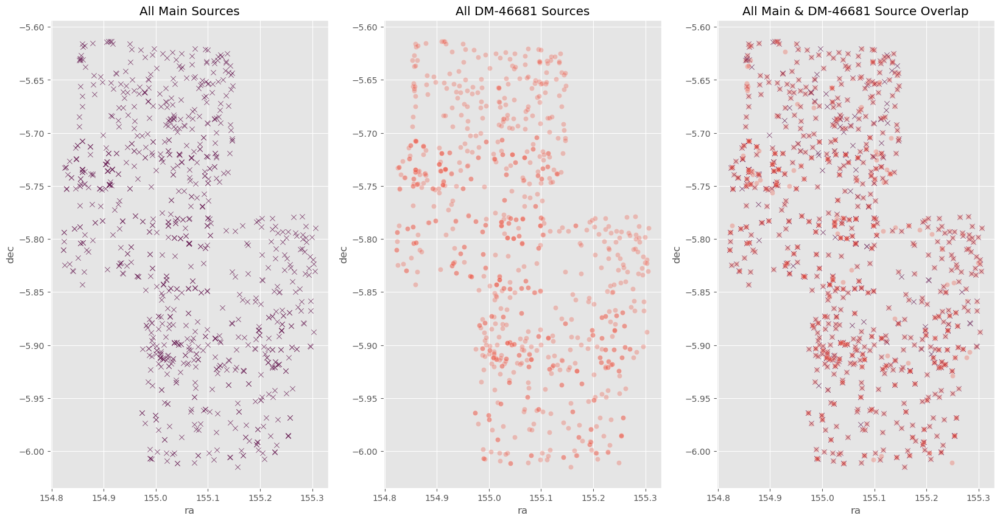

In [13]:
# Full catalogs from DM-46678 and Main
f, axes = plt.subplots(1, 3, figsize=(20,10))
sns.scatterplot(data=main_run['rsrcTable'], x='ra', y='dec', marker='x', color=sns.color_palette("rocket", 10)[2], alpha=1.0, ax=axes[0]).set(title=f'All Main Sources');
sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', marker='o', color=sns.color_palette("rocket", 10)[6], alpha=0.3, ax=axes[1]).set(title=f'All DM-46681 Sources');
sns.scatterplot(data=main_run['rsrcTable'], x='ra', y='dec', marker='x', color=sns.color_palette("rocket", 10)[2], alpha=1.0, ax=axes[2]).set(title=f'All Main & DM-46681 Source Overlap');
sns.scatterplot(data=updated_run['rsrcTable'], x='ra', y='dec', marker='o', color=sns.color_palette("rocket", 10)[6], alpha=0.3, ax=axes[2]);


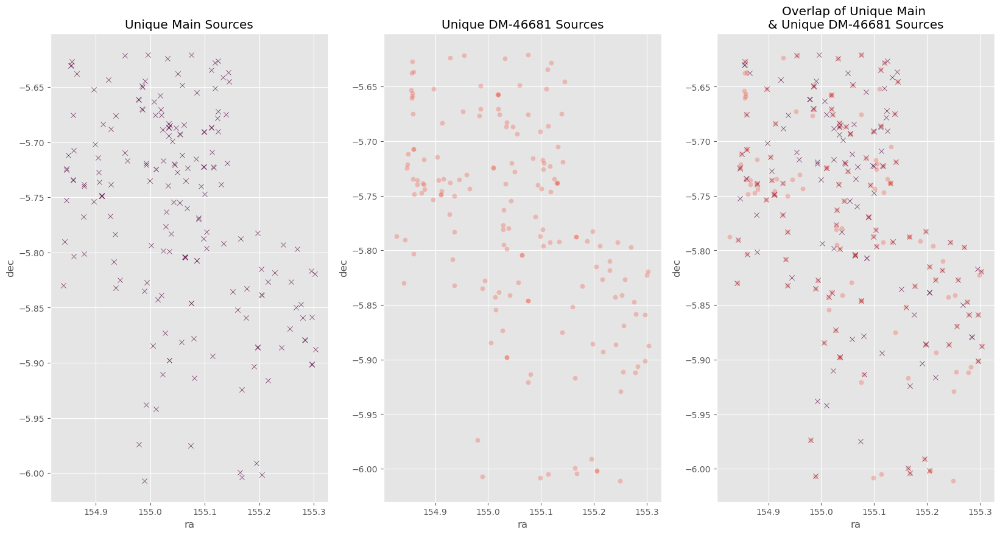

In [14]:
# Full catalogs from DM-46678 and Main
f, axes = plt.subplots(1, 3, figsize=(20,10))
sns.scatterplot(data=uniqueMain, x='ra', y='dec', marker='x', color=sns.color_palette("rocket", 10)[2], alpha=1.0, ax=axes[0]).set(title=f'Unique Main Sources');
sns.scatterplot(data=uniqueUpdated, x='ra', y='dec', marker='o', color=sns.color_palette("rocket", 10)[6], alpha=0.3, ax=axes[1]).set(title=f'Unique DM-46681 Sources');
sns.scatterplot(data=uniqueMain, x='ra', y='dec', marker='x', color=sns.color_palette("rocket", 10)[2], alpha=1.0, ax=axes[2]).set(title=f'Overlap of Unique Main \n& Unique DM-46681 Sources');
sns.scatterplot(data=uniqueUpdated, x='ra', y='dec', marker='o', color=sns.color_palette("rocket", 10)[6], alpha=0.3, ax=axes[2]);


### 6. Visualizing Flags

In [15]:
flagList = ['pixelFlags_bad', 'pixelFlags_crCenter', 'pixelFlags_interpolatedCenter', 'pixelFlags_saturatedCenter', 
            'pixelFlags_suspectCenter', 'pixelFlags_streakCenter', 'pixelFlags_injectedCenter', 'pixelFlags_injected_templateCenter']

In [16]:
def visualFlagComparison(mainRunSources, updatedRunSources, mainName, updatedName, status):
    for flag in flagList:
        main = mainRunSources[mainRunSources[flag]==status]
        updated = updatedRunSources[updatedRunSources[flag]==status]

        if status==True:
            sameSources = []
            for m, u in zip(main['diaSourceId'], updated['diaSourceId']):
                if m==u:
                    sameSources.append(u)
            
            if len(sameSources)>1:
                print(f'{flag} contains overlapping sourceIds: {sameSources}\n')
        
        if len(main)>1 or len(updated)>1:
            f, axes = plt.subplots(1, 3, figsize=(20,10))
            sns.scatterplot(data=main, x='ra', y='dec', marker='X', color=sns.color_palette("rocket", 8)[1], alpha=0.75, ax=axes[0]).set(title=f'{mainName}: \n{flag} = {status}')
            sns.scatterplot(data=updated, x='ra', y='dec', color=sns.color_palette("rocket", 8)[6], alpha=0.75, ax=axes[1]).set(title=f'{updatedName}: \n{flag} = {status}')
            sns.scatterplot(data=main, x='ra', y='dec', marker='X', color=sns.color_palette("rocket", 8)[1], alpha=0.5, ax=axes[2]).set(title=f'{mainName} & {updatedName}: \n{flag} = {status}')
            sns.scatterplot(data=updated, x='ra', y='dec', color=sns.color_palette("rocket", 8)[6], alpha=0.5, ax=axes[2])

pixelFlags_suspectCenter contains overlapping sourceIds: [88341369835225090, 88341369835225091, 88341378425159681, 88341378425159682, 88341378425159683, 88341378425159684, 88341378425159866, 88351793720852481]



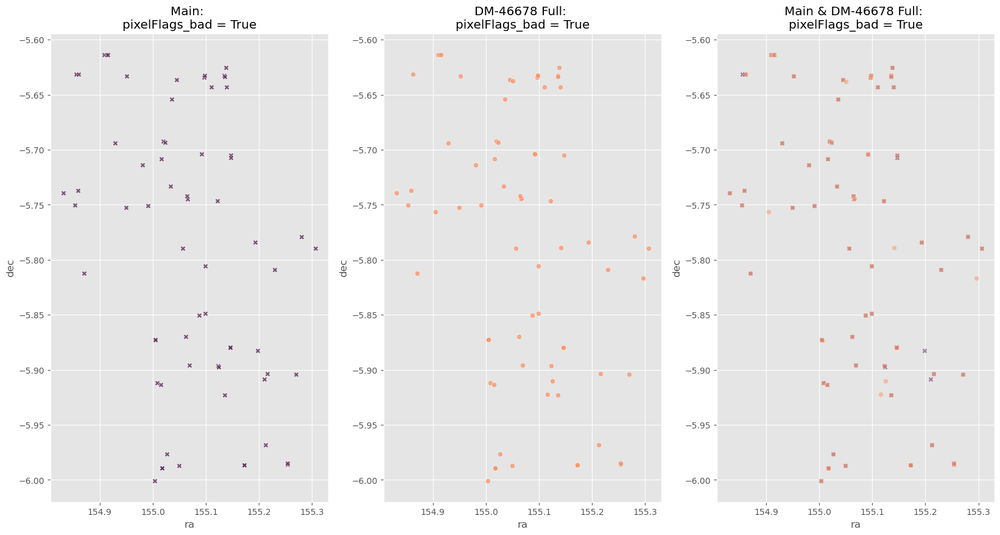

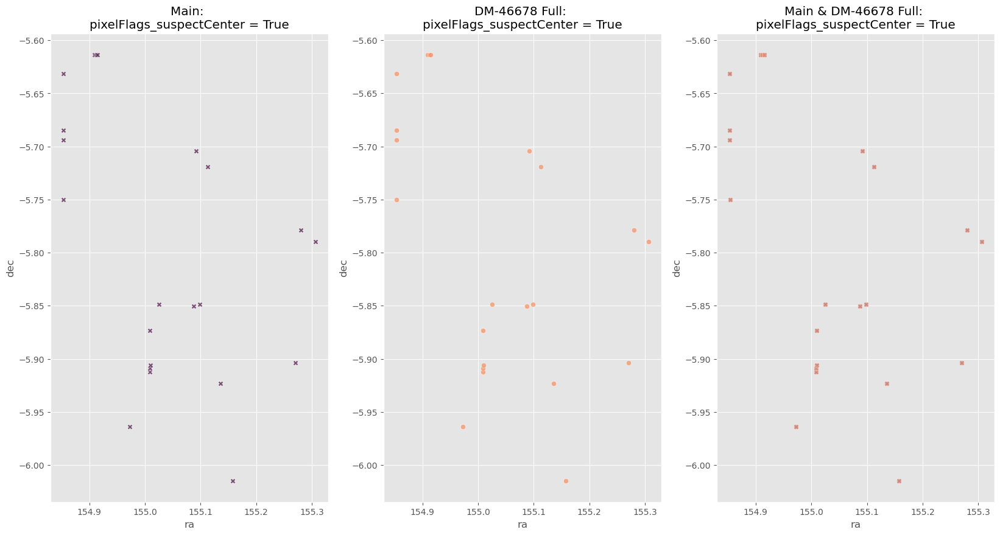

In [17]:
visualFlagComparison(main_run['rsrcTable'], updated_run['rsrcTable'], 'Main', 'DM-46678 Full', True)

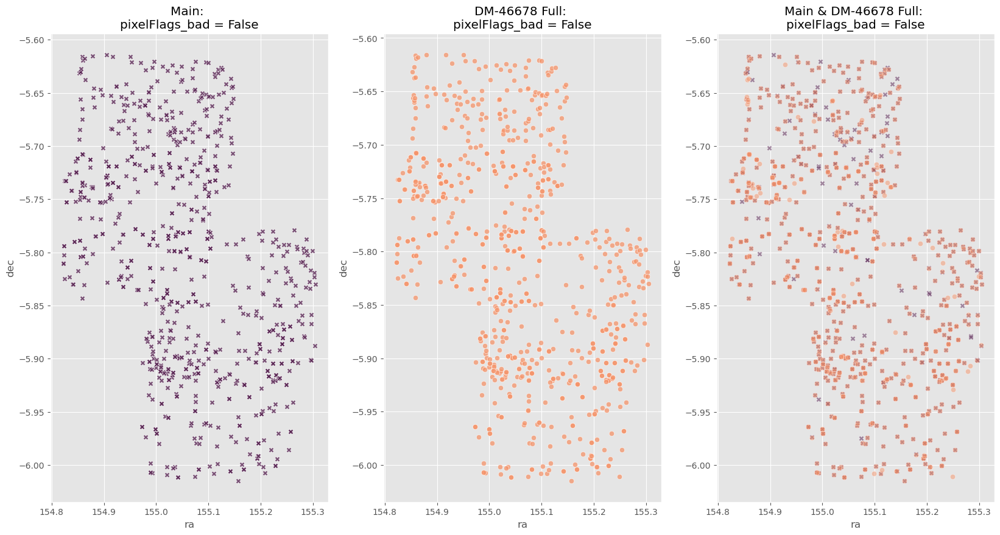

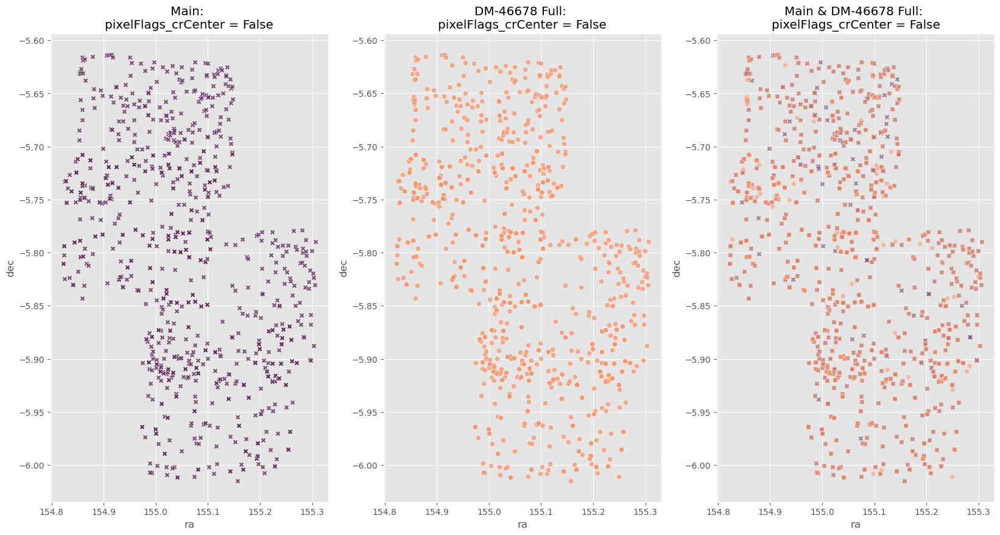

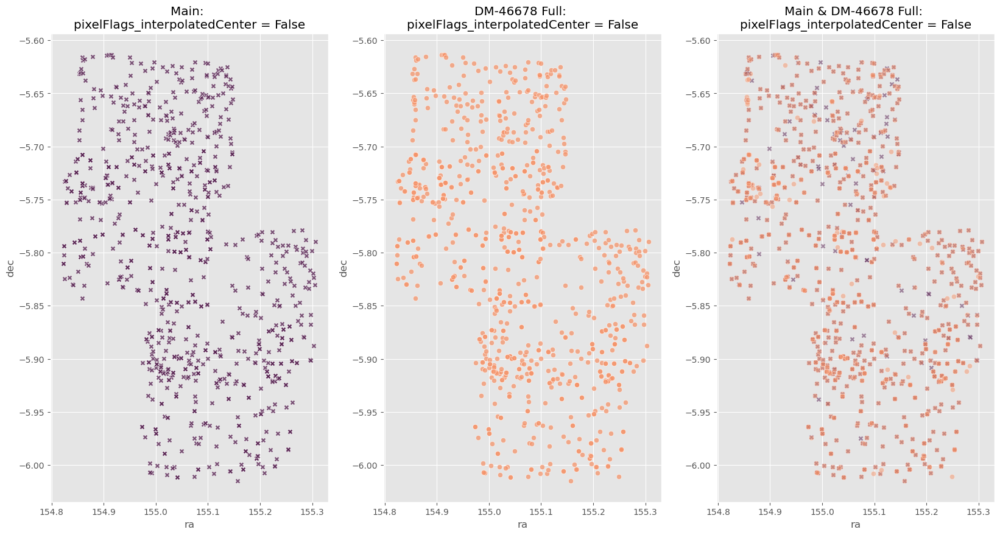

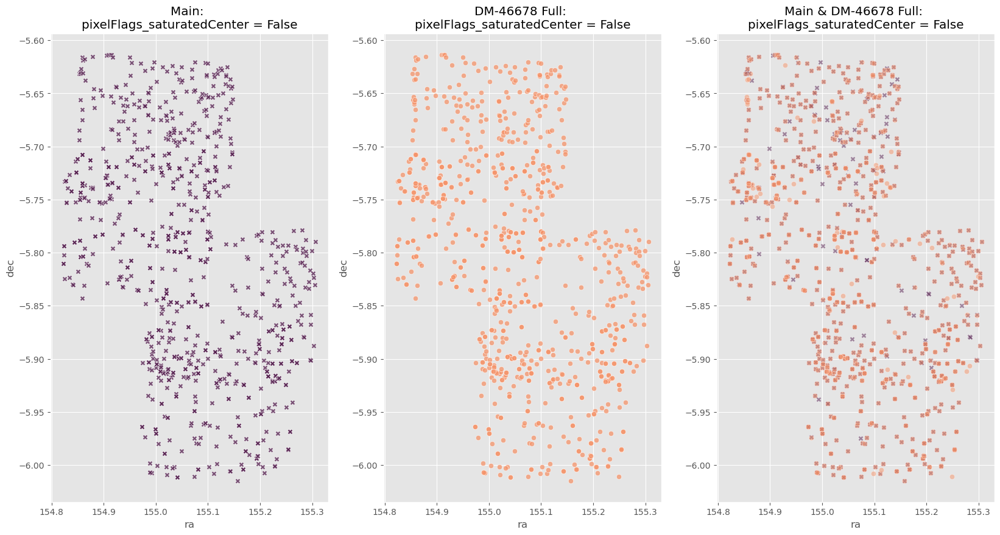

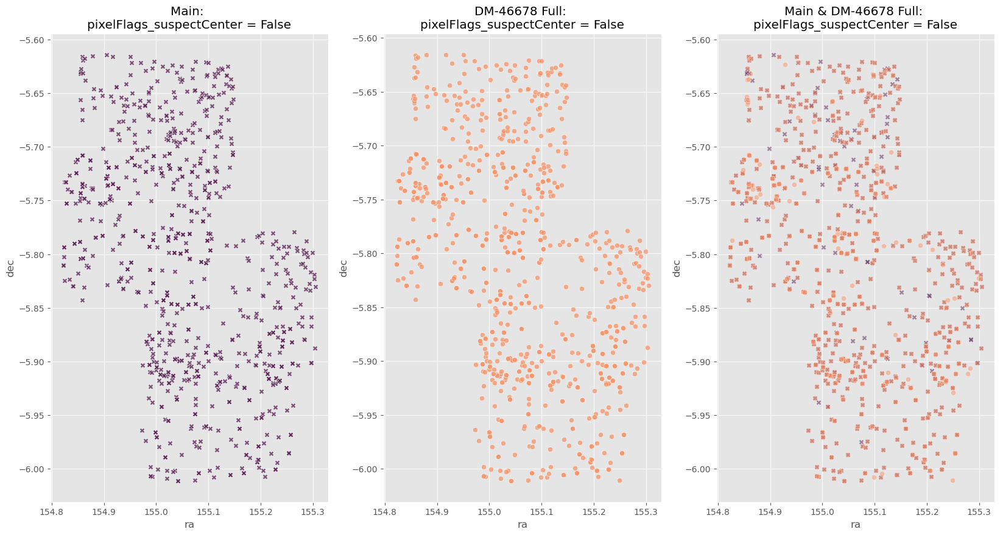

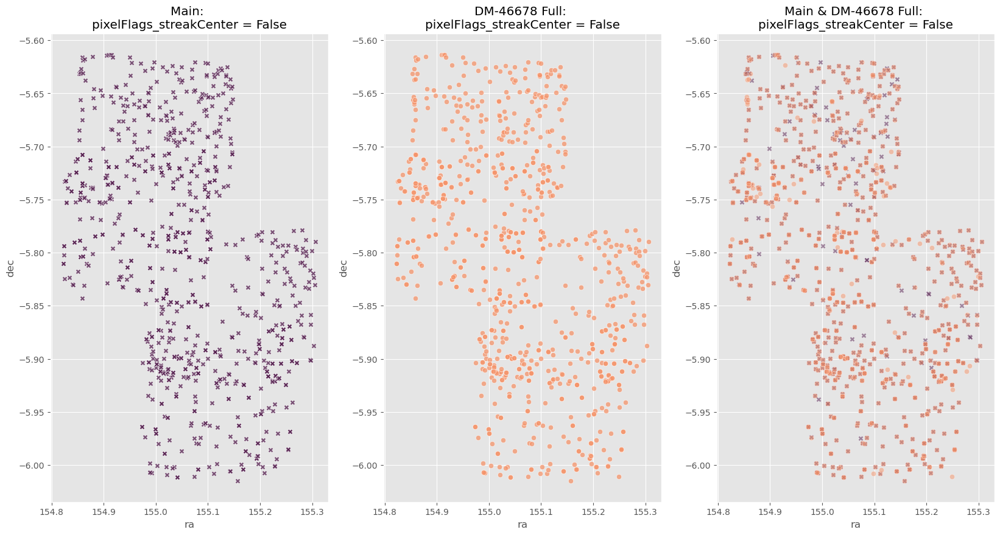

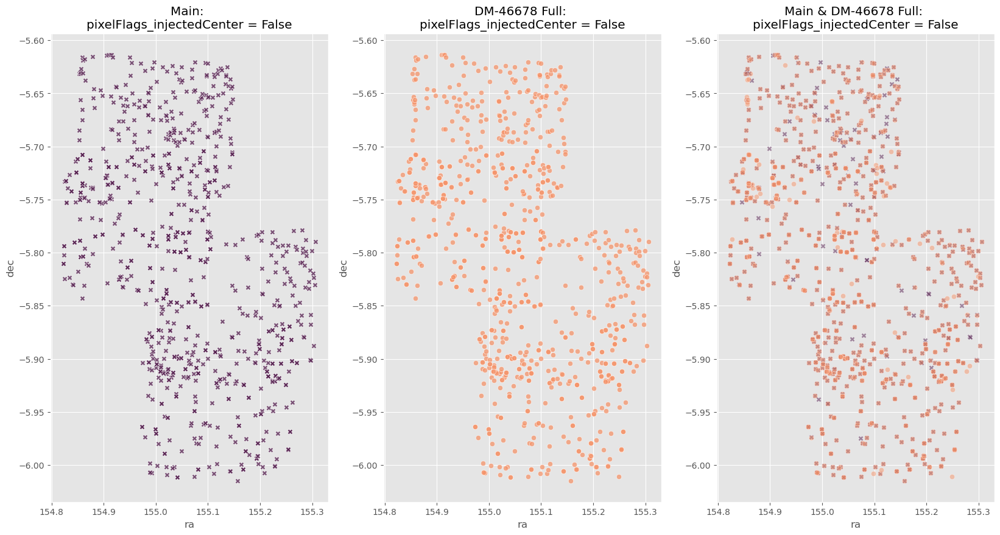

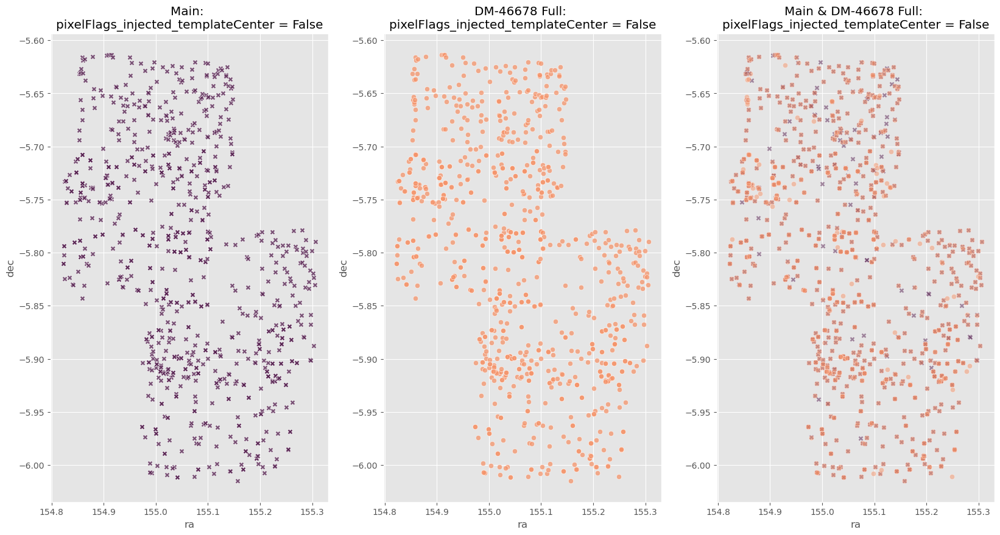

In [18]:
visualFlagComparison(main_run['rsrcTable'], updated_run['rsrcTable'], 'Main', 'DM-46678 Full', False)

In [19]:
def flagComparison(mainRun, updatedRun, status):
    for flag in flagList:
        main = mainRun[mainRun[flag]==status]
        updated = updatedRun[updatedRun[flag]==status]
        if len(main)>1 or len(updated)>1:
            f, axes = plt.subplots(1, 2, figsize=(20,10))
            sns.scatterplot(data=main, x='ra', y='dec', hue='visit', size='detector', style=flag, palette=sns.color_palette("rocket")[::2], alpha=0.5, ax=axes[0]).set(title=f'Main: {flag} = {status}')
            sns.scatterplot(data=updated, x='ra', y='dec', hue='visit', size='detector', style=flag, palette=sns.color_palette("rocket")[::2], alpha=0.5, ax=axes[1]).set(title=f'DM-42979: {flag} = {status}')
    
            f, axes = plt.subplots(1, 3, figsize=(20,10))
            sns.scatterplot(data=main, x='ra', y='dec', color=sns.color_palette("rocket")[1], marker='x', alpha=1.0, ax=axes[0]).set(title=f'Main: {flag} = {status}')
            sns.scatterplot(data=updated, x='ra', y='dec', color=sns.color_palette("rocket")[3], marker='o', alpha=0.5, ax=axes[1]).set(title=f'DM-42979: {flag} = {status}')
            sns.scatterplot(data=main, x='ra', y='dec', color=sns.color_palette("rocket")[1], marker='x', alpha=1.0, ax=axes[2]).set(title=f'Main + DM-42979: {flag} = {status}')
            sns.scatterplot(data=updated, x='ra', y='dec', color=sns.color_palette("rocket")[3], marker='o', alpha=0.5, ax=axes[2])

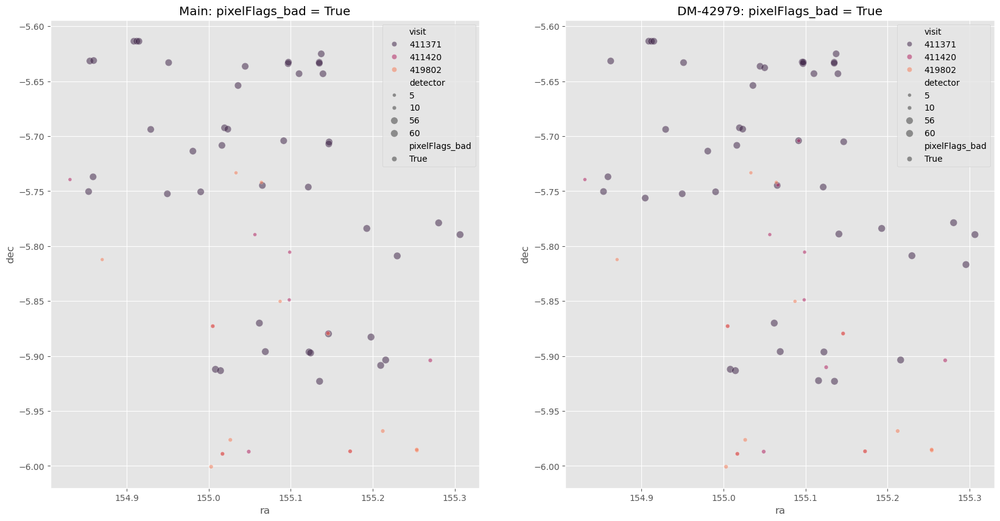

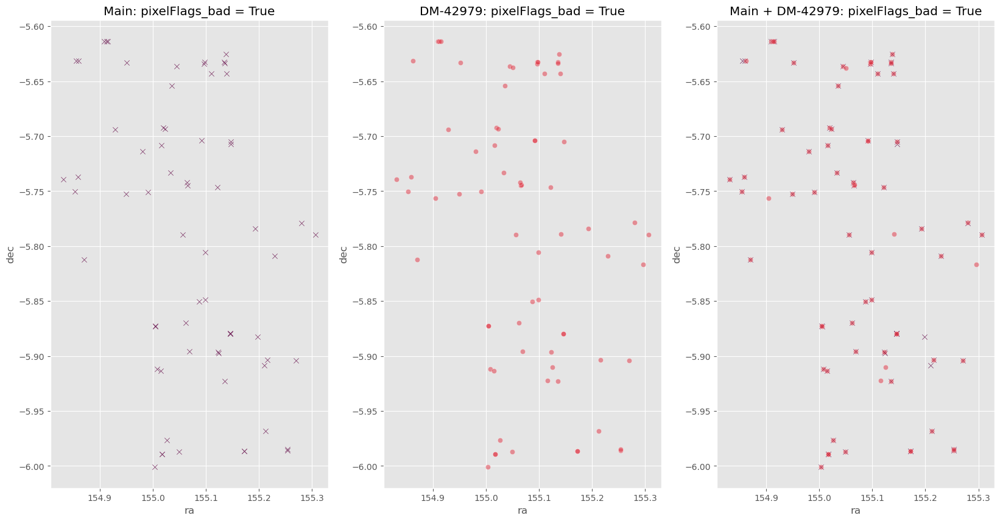

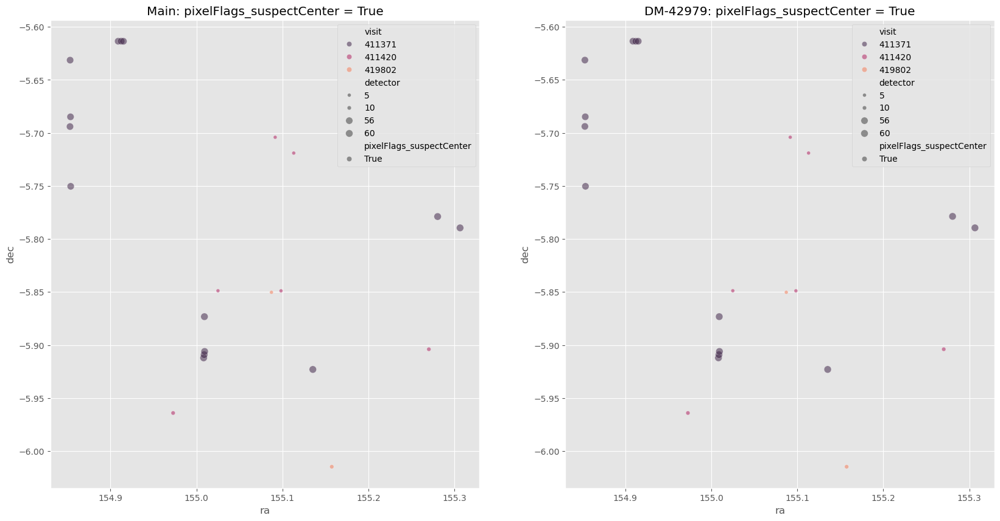

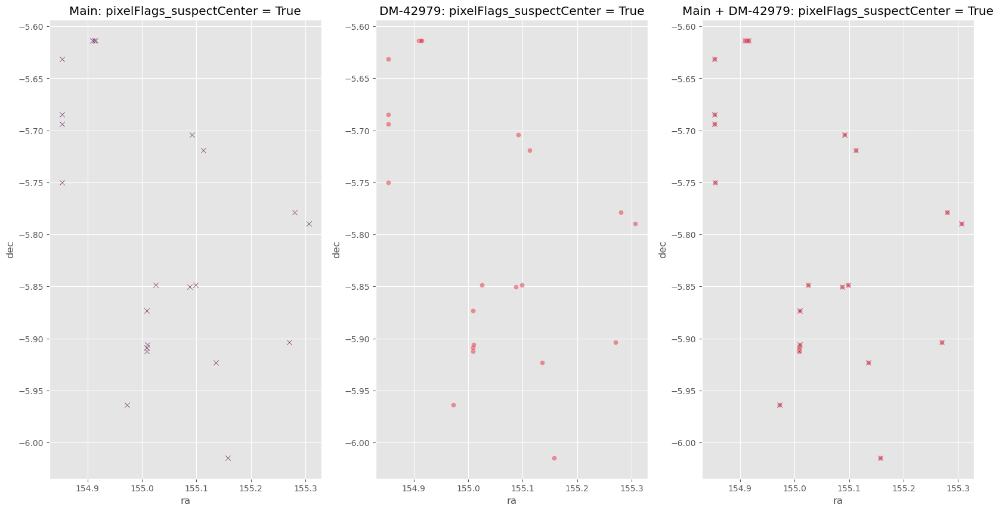

In [20]:
flagComparison(main_run['rsrcTable'], updated_run['rsrcTable'], True)

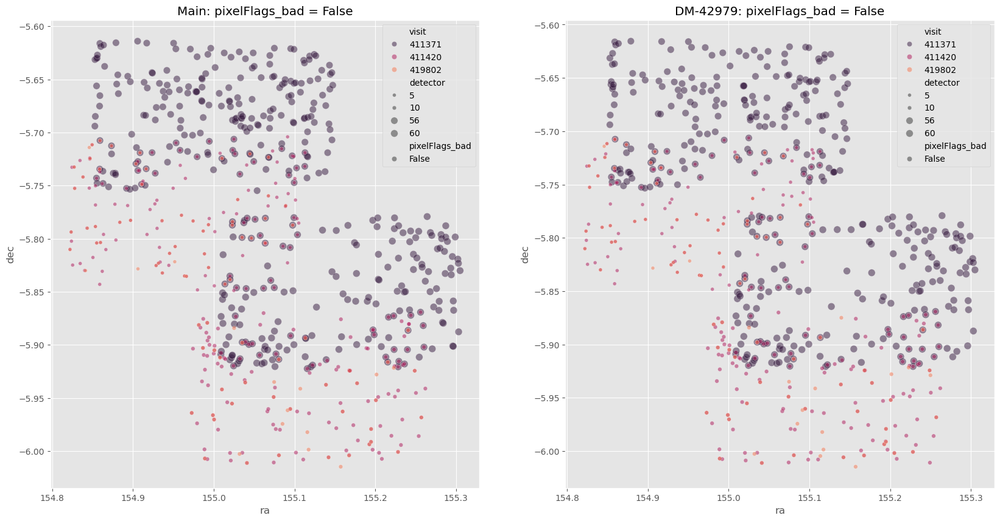

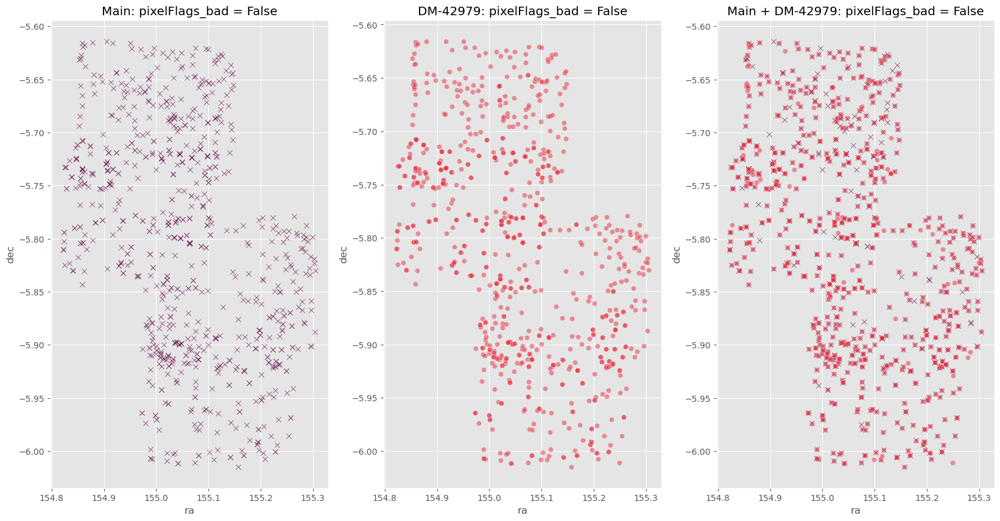

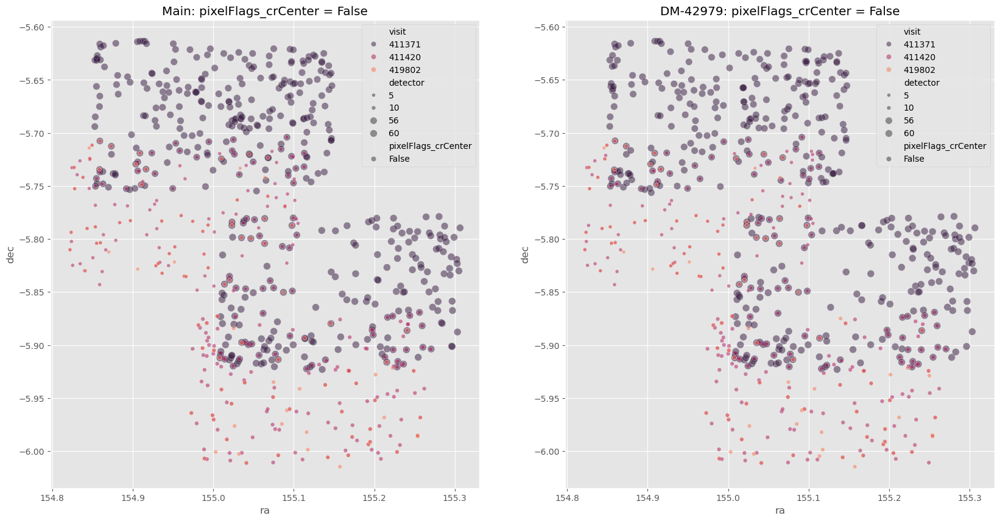

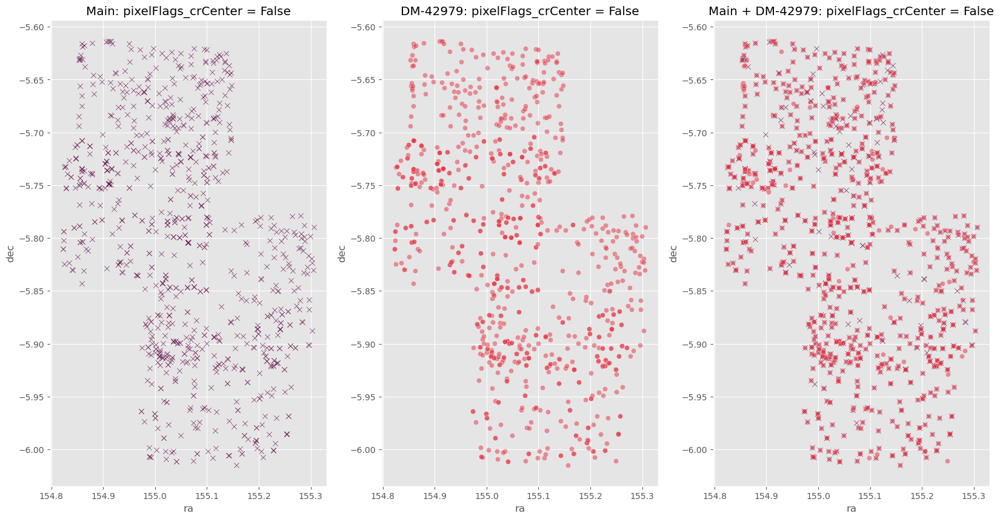

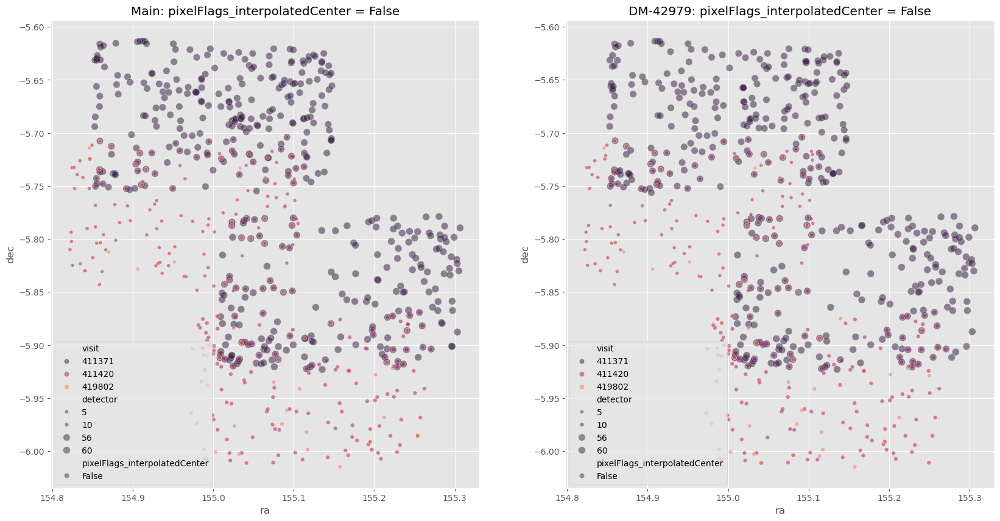

...

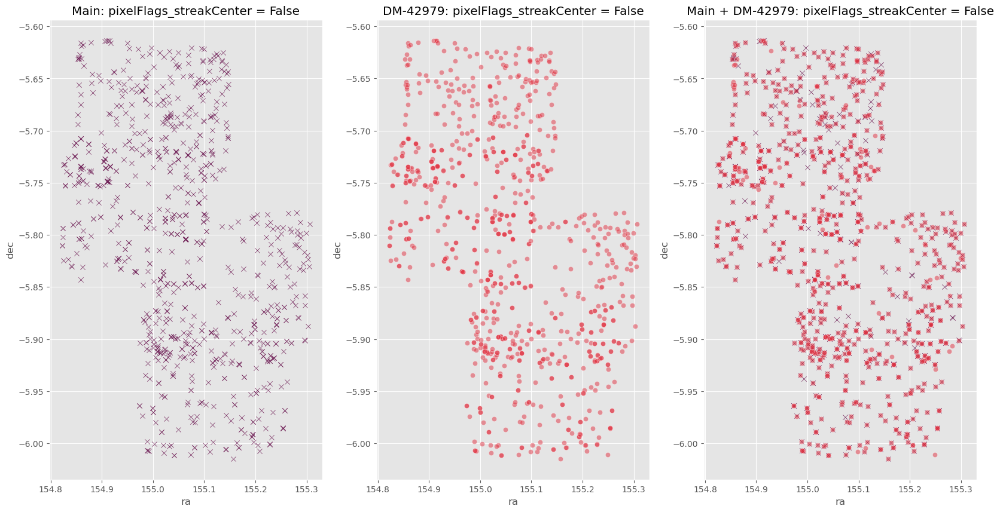

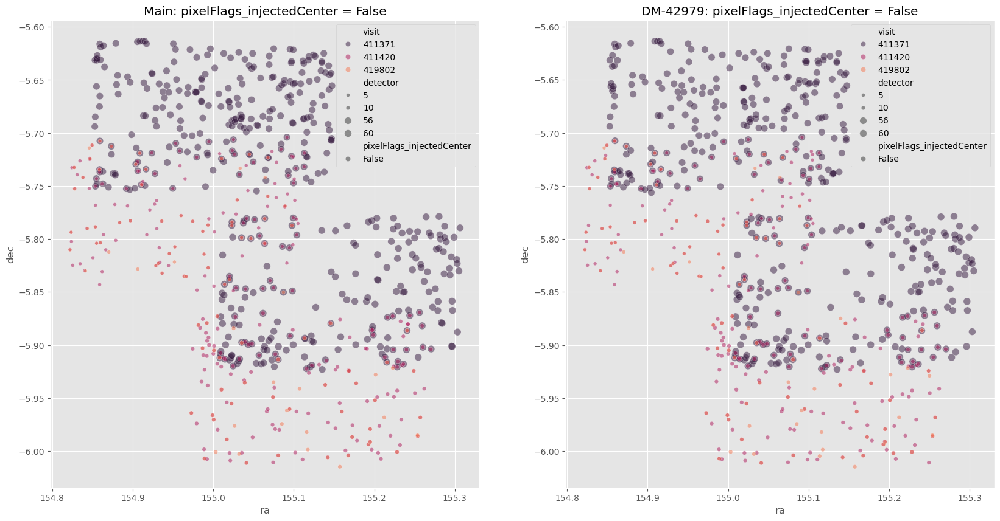

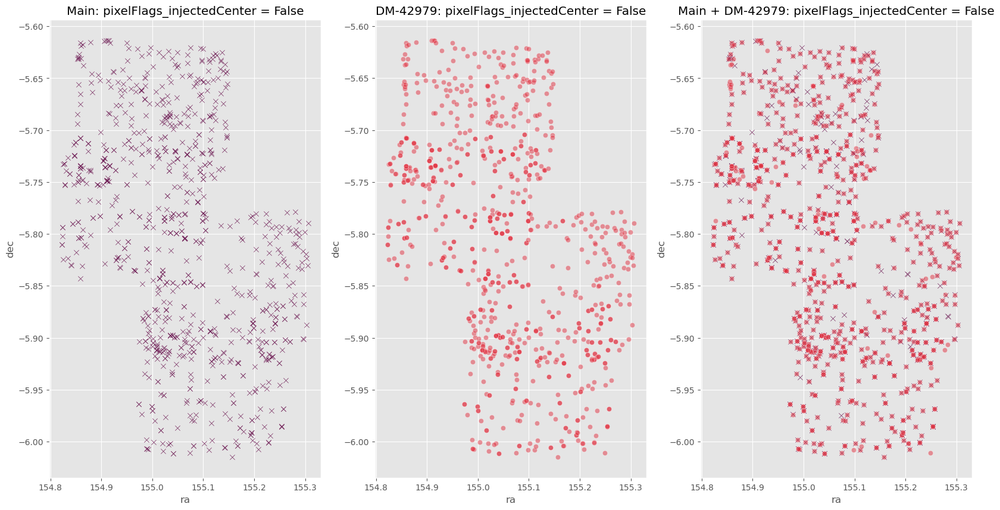

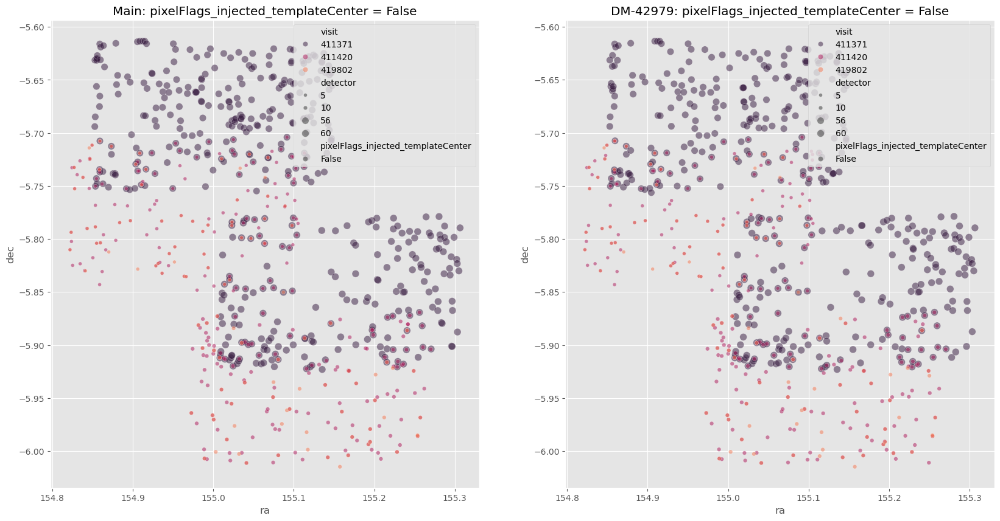

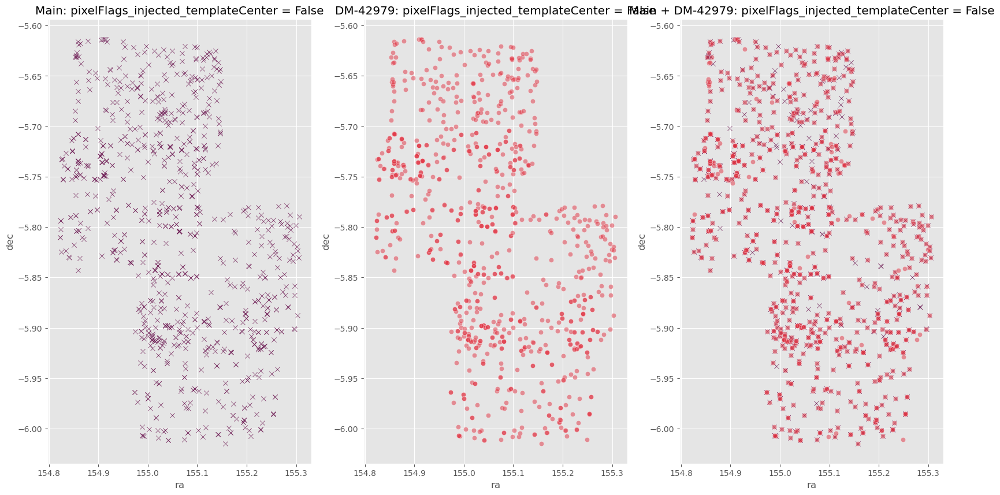

In [21]:
flagComparison(main_run['rsrcTable'], updated_run['rsrcTable'], False)